In [1]:
# TASK 1: Data Loading & Structure Understanding

import pandas as pd
import numpy as np
from google.colab import files

print("\n=== TASK 1: DATA LOADING & STRUCTURE UNDERSTANDING ===")

uploaded = files.upload()
file_name = list(uploaded.keys())[0]
df = pd.read_csv(file_name)

print('\nShape:', df.shape)
print('\nColumns:', df.columns.tolist())
print('\nData Types:\n', df.dtypes)
print('\nNumerical Columns:', df.select_dtypes(include=[np.number]).columns.tolist())
print('\nCategorical Columns:', df.select_dtypes(exclude=[np.number]).columns.tolist())

print('\nFirst 5 rows:')
print(df.head().to_string(index=False))



=== TASK 1: DATA LOADING & STRUCTURE UNDERSTANDING ===


Saving waterQuality1.csv to waterQuality1.csv

Shape: (7999, 21)

Columns: ['aluminium', 'ammonia', 'arsenic', 'barium', 'cadmium', 'chloramine', 'chromium', 'copper', 'flouride', 'bacteria', 'viruses', 'lead', 'nitrates', 'nitrites', 'mercury', 'perchlorate', 'radium', 'selenium', 'silver', 'uranium', 'is_safe']

Data Types:
 aluminium      float64
ammonia         object
arsenic        float64
barium         float64
cadmium        float64
chloramine     float64
chromium       float64
copper         float64
flouride       float64
bacteria       float64
viruses        float64
lead           float64
nitrates       float64
nitrites       float64
mercury        float64
perchlorate    float64
radium         float64
selenium       float64
silver         float64
uranium        float64
is_safe         object
dtype: object

Numerical Columns: ['aluminium', 'arsenic', 'barium', 'cadmium', 'chloramine', 'chromium', 'copper', 'flouride', 'bacteria', 'viruses', 'lead', 'nitrates', 'nitrites', 'merc

In [2]:
# TASK 2: Data Cleaning

import numpy as np

print("\n=== TASK 2: DATA CLEANING ===")

print('\nMissing Values:\n', df.isnull().sum())

# Fill numeric missing values
num_cols = df.select_dtypes(include=[np.number]).columns.tolist()
for c in num_cols:
    if df[c].isnull().any():
        df[c].fillna(df[c].median(), inplace=True)
        print(f"Filled missing values in {c} with median")

# Fill categorical missing values
cat_cols = df.select_dtypes(exclude=[np.number]).columns.tolist()
for c in cat_cols:
    if df[c].isnull().any():
        df[c].fillna(df[c].mode()[0], inplace=True)
        print(f"Filled missing values in {c} with mode")

# pH validity check
if "pH" in df.columns:
    df.loc[df["pH"] < 0, "pH"] = 0
    df.loc[df["pH"] > 14, "pH"] = 14
    print("Corrected invalid pH values (clipped to 0–14)")

# Remove duplicates
dups = df.duplicated().sum()
print("Duplicate rows found:", dups)
df.drop_duplicates(inplace=True)
print("After cleaning shape:", df.shape)



=== TASK 2: DATA CLEANING ===

Missing Values:
 aluminium      0
ammonia        0
arsenic        0
barium         0
cadmium        0
chloramine     0
chromium       0
copper         0
flouride       0
bacteria       0
viruses        0
lead           0
nitrates       0
nitrites       0
mercury        0
perchlorate    0
radium         0
selenium       0
silver         0
uranium        0
is_safe        0
dtype: int64
Duplicate rows found: 0
After cleaning shape: (7999, 21)



=== TASK 3: UNIVARIATE ANALYSIS ===

--- aluminium Summary ---
count    7996.000000
mean        0.666396
std         1.265323
min         0.000000
25%         0.040000
50%         0.070000
75%         0.280000
max         5.050000
Name: aluminium, dtype: float64


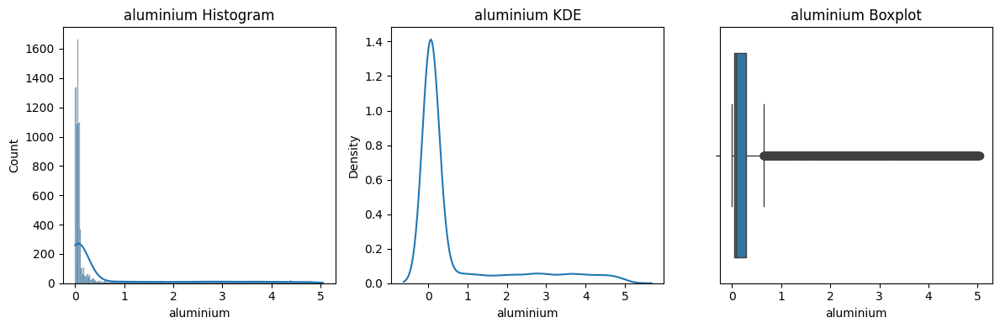


--- arsenic Summary ---
count    7996.000000
mean        0.161477
std         0.252632
min         0.000000
25%         0.030000
50%         0.050000
75%         0.100000
max         1.050000
Name: arsenic, dtype: float64


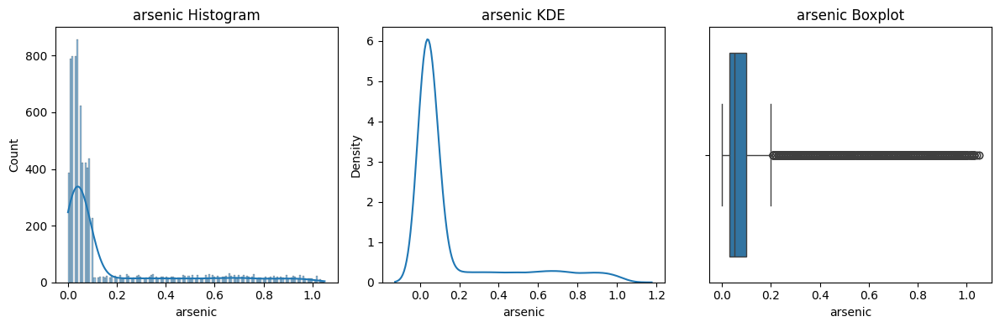


--- barium Summary ---
count    7996.000000
mean        1.567928
std         1.216227
min         0.000000
25%         0.560000
50%         1.190000
75%         2.482500
max         4.940000
Name: barium, dtype: float64


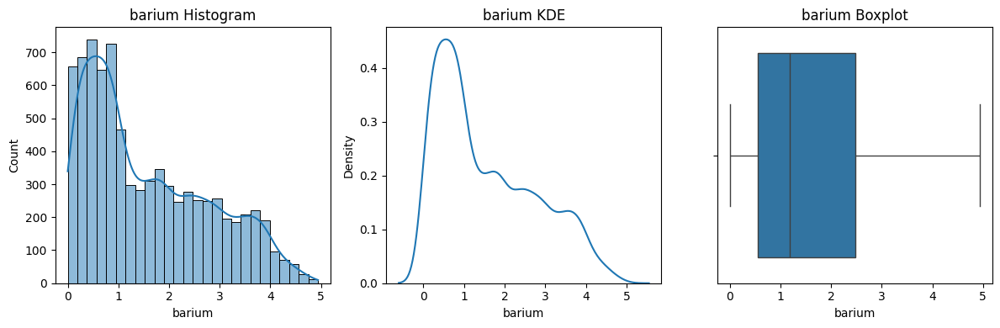


--- cadmium Summary ---
count    7996.000000
mean        0.042803
std         0.036049
min         0.000000
25%         0.008000
50%         0.040000
75%         0.070000
max         0.130000
Name: cadmium, dtype: float64


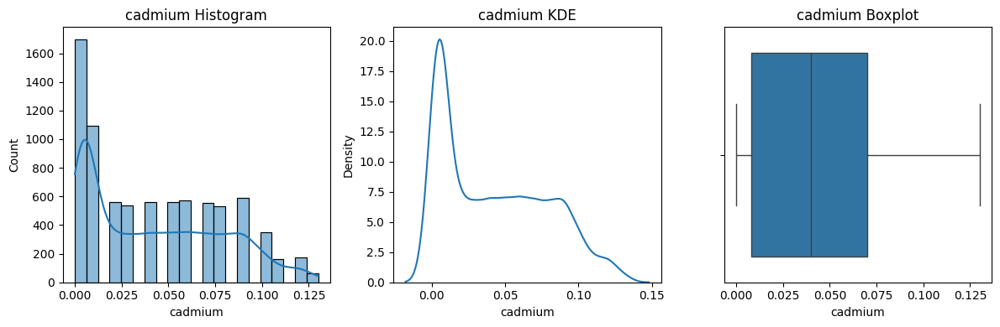


--- chloramine Summary ---
count    7996.000000
mean        2.177589
std         2.567210
min         0.000000
25%         0.100000
50%         0.530000
75%         4.240000
max         8.680000
Name: chloramine, dtype: float64


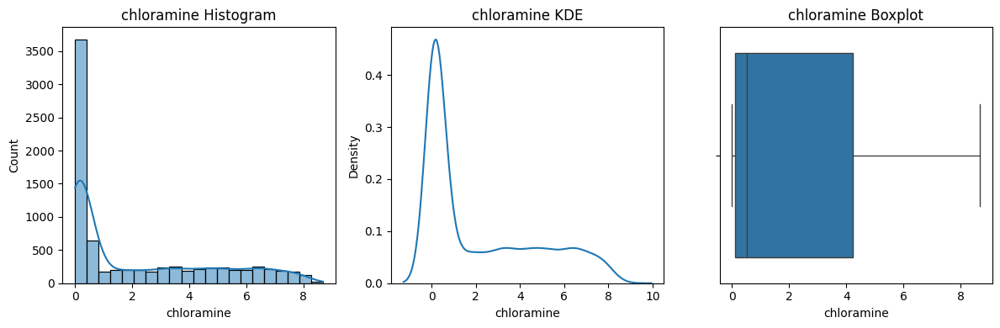


--- chromium Summary ---
count    7996.000000
mean        0.247300
std         0.270663
min         0.000000
25%         0.050000
50%         0.090000
75%         0.440000
max         0.900000
Name: chromium, dtype: float64


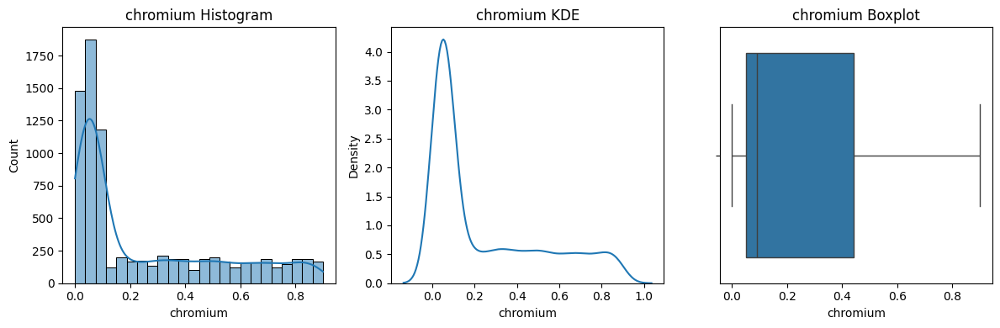


--- copper Summary ---
count    7996.000000
mean        0.805940
std         0.653595
min         0.000000
25%         0.090000
50%         0.750000
75%         1.390000
max         2.000000
Name: copper, dtype: float64


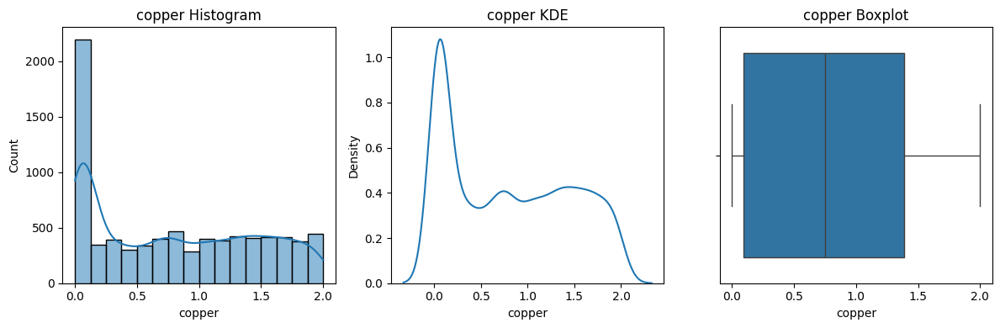


--- flouride Summary ---
count    7996.000000
mean        0.771646
std         0.435423
min         0.000000
25%         0.407500
50%         0.770000
75%         1.160000
max         1.500000
Name: flouride, dtype: float64


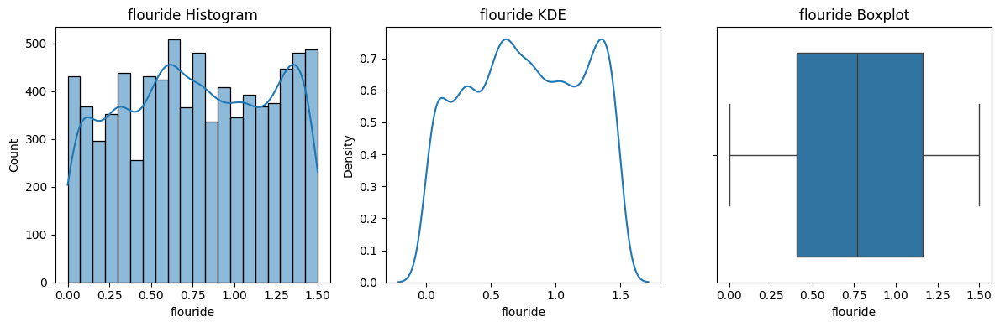


--- bacteria Summary ---
count    7996.000000
mean        0.319714
std         0.329497
min         0.000000
25%         0.000000
50%         0.220000
75%         0.610000
max         1.000000
Name: bacteria, dtype: float64


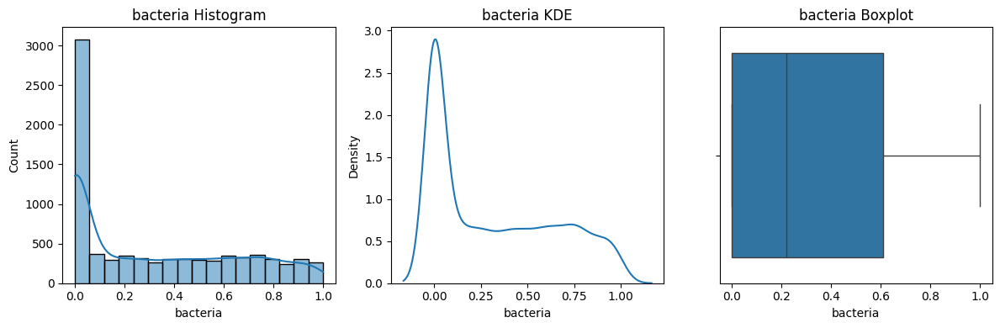


--- viruses Summary ---
count    7996.000000
mean        0.328706
std         0.378113
min         0.000000
25%         0.002000
50%         0.008000
75%         0.700000
max         1.000000
Name: viruses, dtype: float64


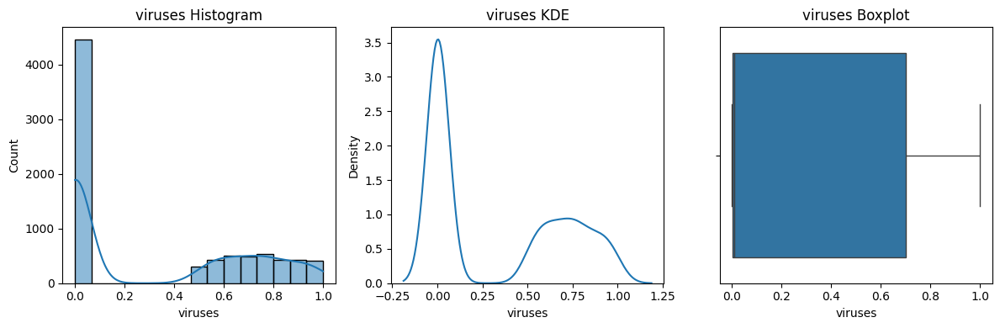


--- lead Summary ---
count    7996.000000
mean        0.099431
std         0.058169
min         0.000000
25%         0.048000
50%         0.102000
75%         0.151000
max         0.200000
Name: lead, dtype: float64


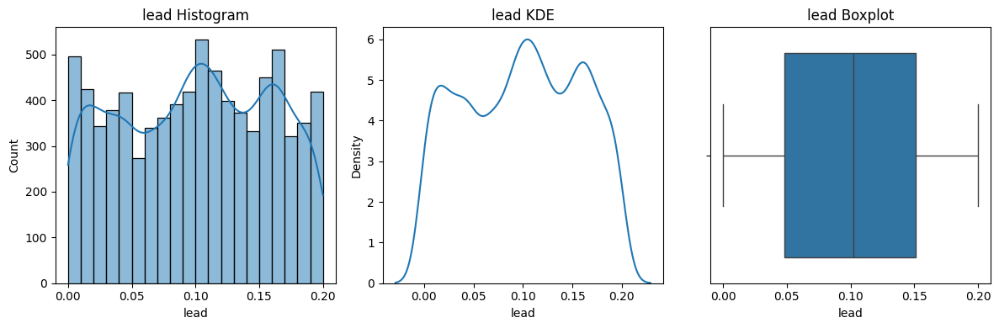


--- nitrates Summary ---
count    7996.000000
mean        9.819250
std         5.541977
min         0.000000
25%         5.000000
50%         9.930000
75%        14.610000
max        19.830000
Name: nitrates, dtype: float64


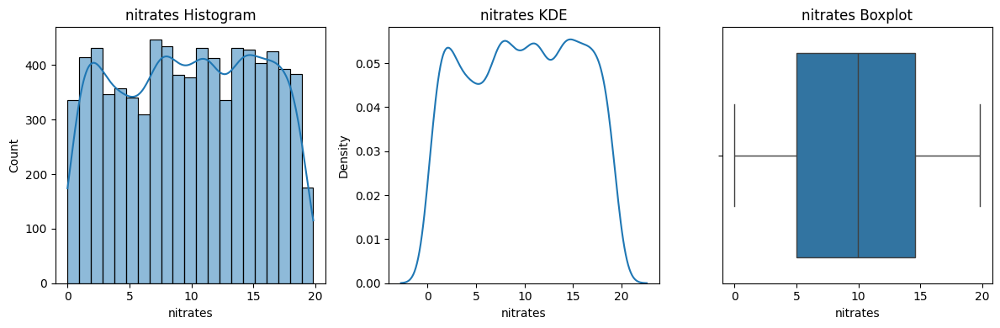


--- nitrites Summary ---
count    7996.000000
mean        1.329846
std         0.573271
min         0.000000
25%         1.000000
50%         1.420000
75%         1.760000
max         2.930000
Name: nitrites, dtype: float64


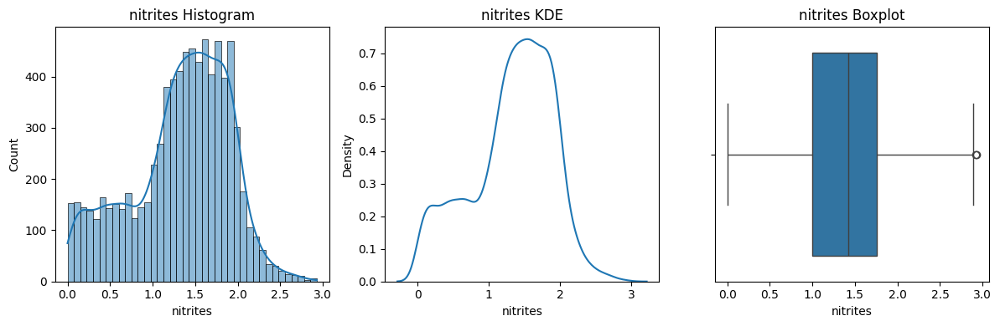


--- mercury Summary ---
count    7996.000000
mean        0.005193
std         0.002967
min         0.000000
25%         0.003000
50%         0.005000
75%         0.008000
max         0.010000
Name: mercury, dtype: float64


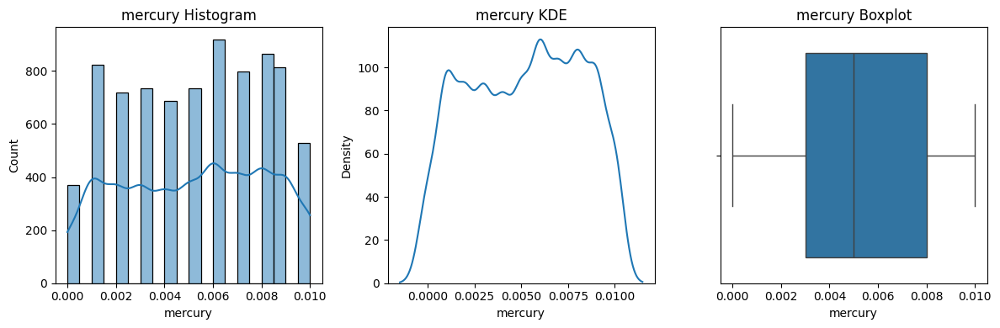


--- perchlorate Summary ---
count    7996.000000
mean       16.465266
std        17.688827
min         0.000000
25%         2.170000
50%         7.745000
75%        29.487500
max        60.010000
Name: perchlorate, dtype: float64


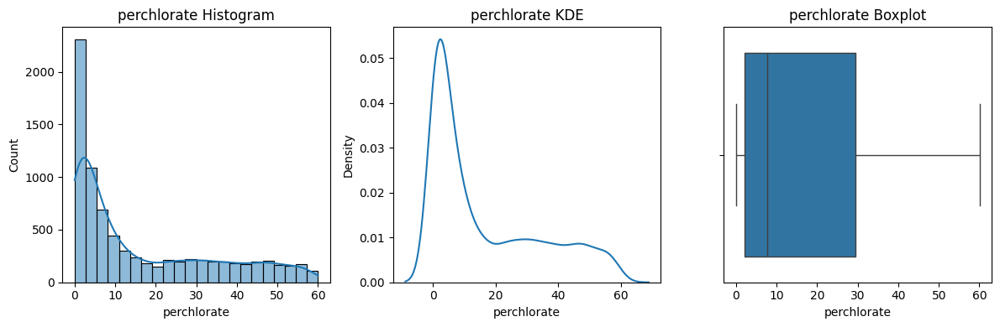


--- radium Summary ---
count    7996.000000
mean        2.920106
std         2.322805
min         0.000000
25%         0.820000
50%         2.410000
75%         4.670000
max         7.990000
Name: radium, dtype: float64


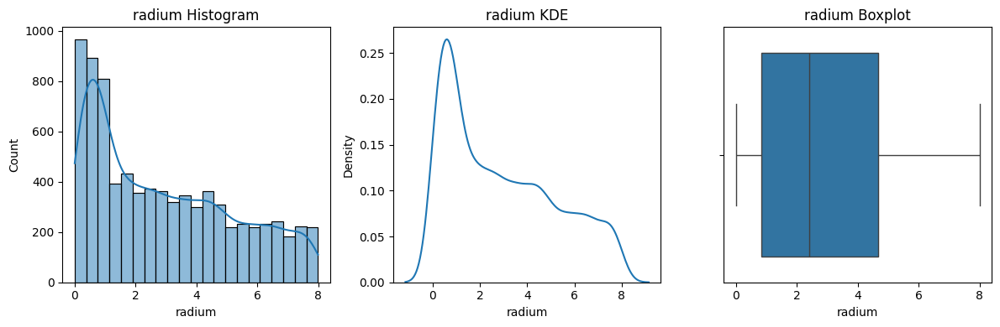


--- selenium Summary ---
count    7996.000000
mean        0.049684
std         0.028773
min         0.000000
25%         0.020000
50%         0.050000
75%         0.070000
max         0.100000
Name: selenium, dtype: float64


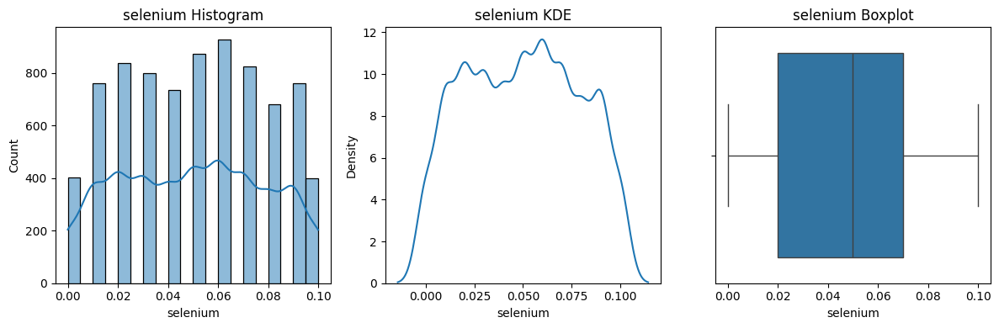


--- silver Summary ---
count    7996.000000
mean        0.147811
std         0.143569
min         0.000000
25%         0.040000
50%         0.080000
75%         0.240000
max         0.500000
Name: silver, dtype: float64


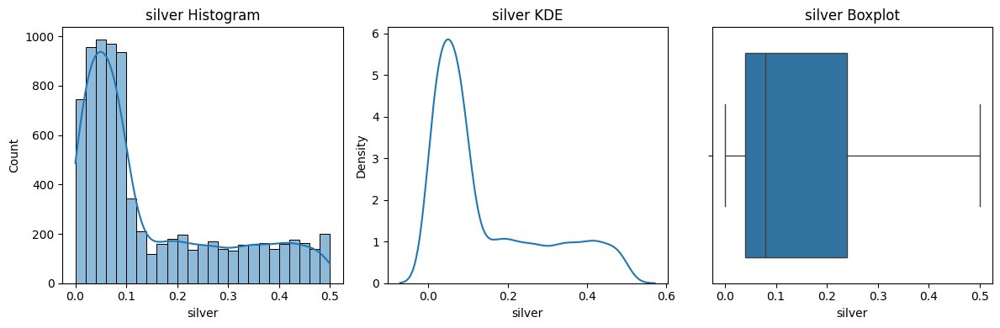


--- uranium Summary ---
count    7996.000000
mean        0.044672
std         0.026906
min         0.000000
25%         0.020000
50%         0.050000
75%         0.070000
max         0.090000
Name: uranium, dtype: float64


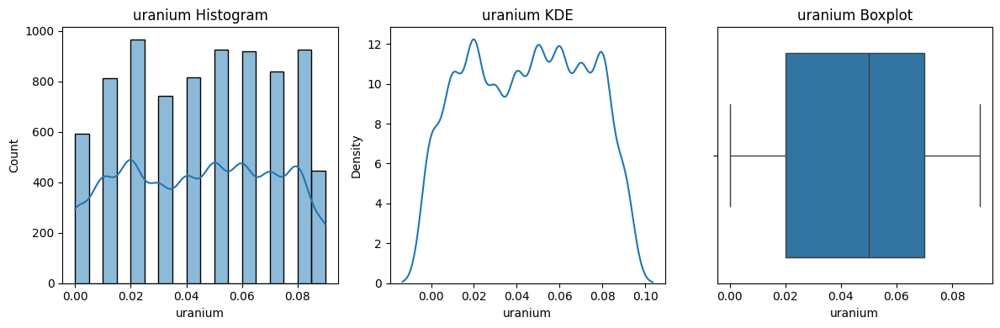


--- is_safe Summary ---
count    7996.000000
mean        0.114057
std         0.317900
min         0.000000
25%         0.000000
50%         0.000000
75%         0.000000
max         1.000000
Name: is_safe, dtype: float64


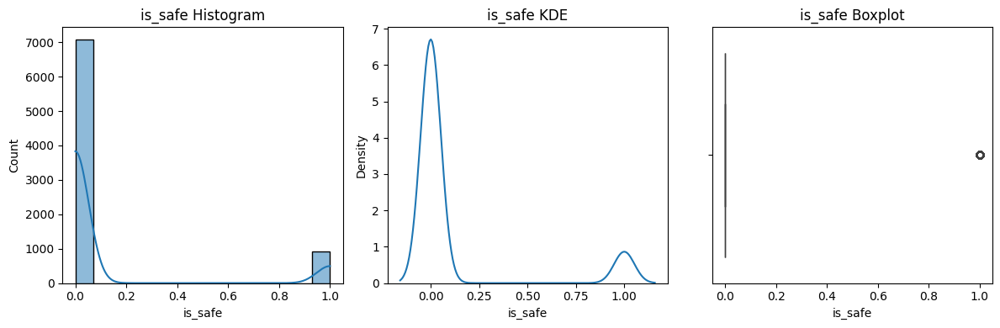

In [12]:
# --- TASK 3: UNIVARIATE ANALYSIS ---

import matplotlib.pyplot as plt
import seaborn as sns

print("\n=== TASK 3: UNIVARIATE ANALYSIS ===")

num_cols = df.select_dtypes(include=['number']).columns.tolist()

for col in num_cols:
    print(f"\n--- {col} Summary ---")
    print(df[col].describe())

    plt.figure(figsize=(12,4))

    plt.subplot(1,3,1)
    sns.histplot(df[col], kde=True)
    plt.title(f"{col} Histogram")

    plt.subplot(1,3,2)
    sns.kdeplot(df[col])
    plt.title(f"{col} KDE")

    plt.subplot(1,3,3)
    sns.boxplot(x=df[col])
    plt.title(f"{col} Boxplot")

    plt.tight_layout()
    plt.show()



=== TASK 4: BIVARIATE ANALYSIS WITH is_safe ===

Invalid/non-numeric is_safe entries: 0

Class Counts:
 is_safe
0    7084
1     912
Name: count, dtype: int64


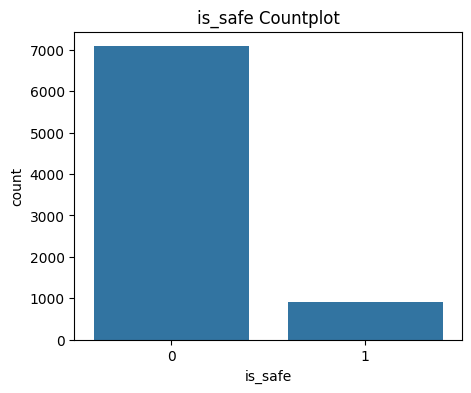


--- aluminium vs is_safe ---


/tmp/ipython-input-2917442429.py:43: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.barplot(x='is_safe', y=col, data=df, ci=None)


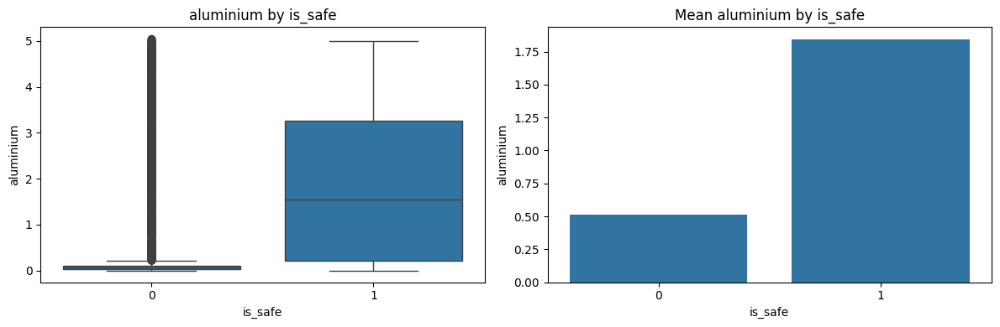

Means:
 is_safe
0    0.514780
1    1.844079
Name: aluminium, dtype: float64

--- arsenic vs is_safe ---


/tmp/ipython-input-2917442429.py:43: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.barplot(x='is_safe', y=col, data=df, ci=None)


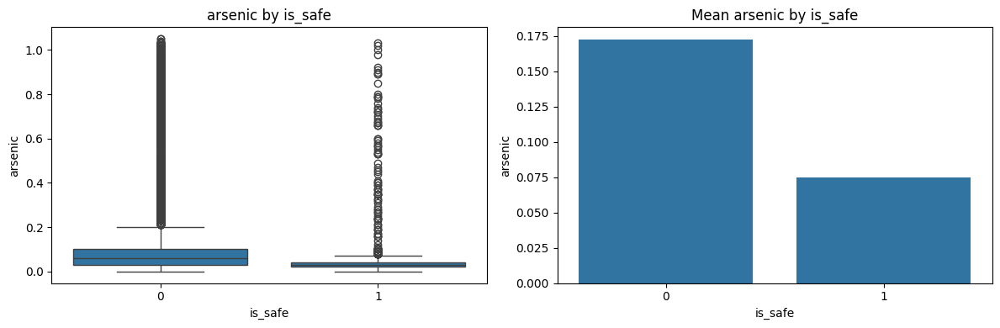

Means:
 is_safe
0    0.172659
1    0.074624
Name: arsenic, dtype: float64

--- barium vs is_safe ---


/tmp/ipython-input-2917442429.py:43: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.barplot(x='is_safe', y=col, data=df, ci=None)


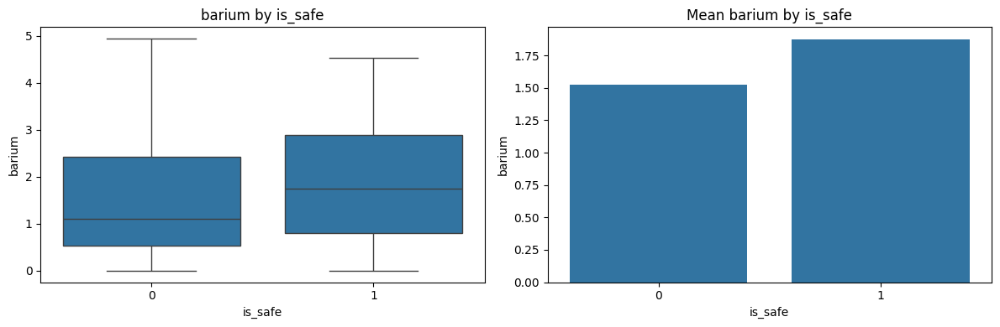

Means:
 is_safe
0    1.528281
1    1.875888
Name: barium, dtype: float64

--- cadmium vs is_safe ---


/tmp/ipython-input-2917442429.py:43: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.barplot(x='is_safe', y=col, data=df, ci=None)


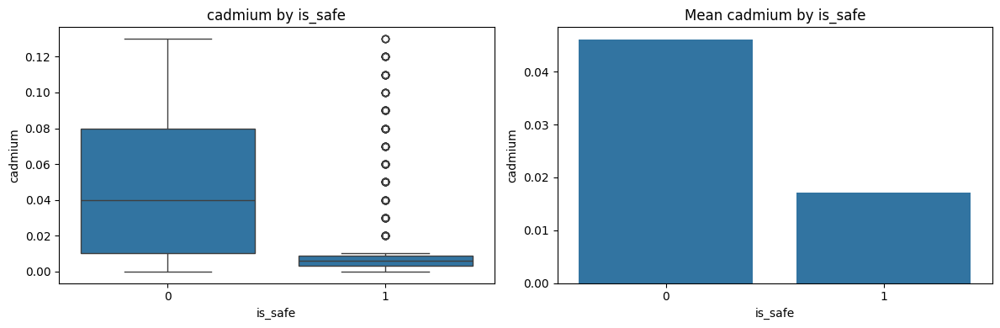

Means:
 is_safe
0    0.046115
1    0.017081
Name: cadmium, dtype: float64

--- chloramine vs is_safe ---


/tmp/ipython-input-2917442429.py:43: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.barplot(x='is_safe', y=col, data=df, ci=None)


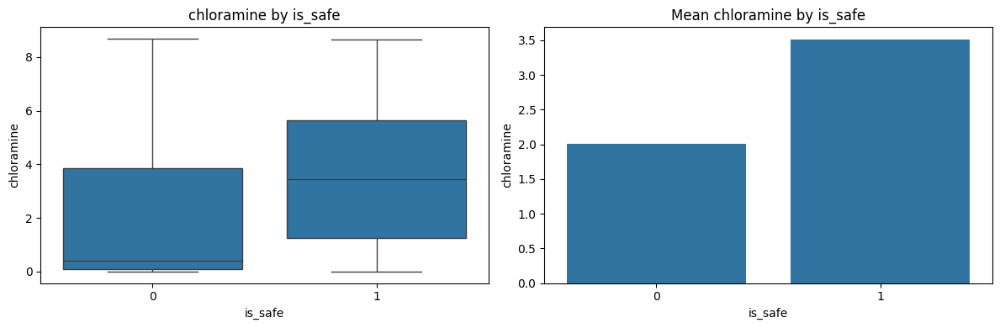

Means:
 is_safe
0    2.005621
1    3.513355
Name: chloramine, dtype: float64

--- chromium vs is_safe ---


/tmp/ipython-input-2917442429.py:43: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.barplot(x='is_safe', y=col, data=df, ci=None)


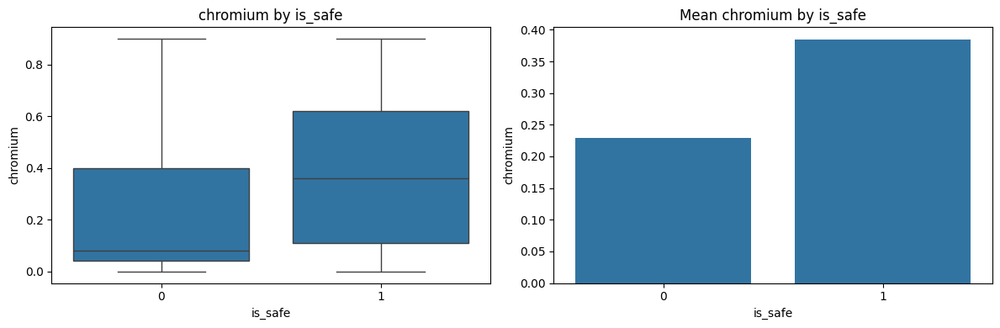

Means:
 is_safe
0    0.229596
1    0.384814
Name: chromium, dtype: float64

--- copper vs is_safe ---


/tmp/ipython-input-2917442429.py:43: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.barplot(x='is_safe', y=col, data=df, ci=None)


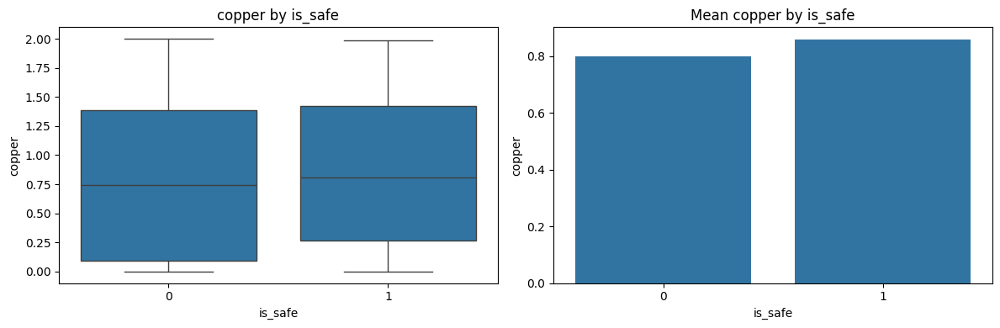

Means:
 is_safe
0    0.799023
1    0.859671
Name: copper, dtype: float64

--- flouride vs is_safe ---


/tmp/ipython-input-2917442429.py:43: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.barplot(x='is_safe', y=col, data=df, ci=None)


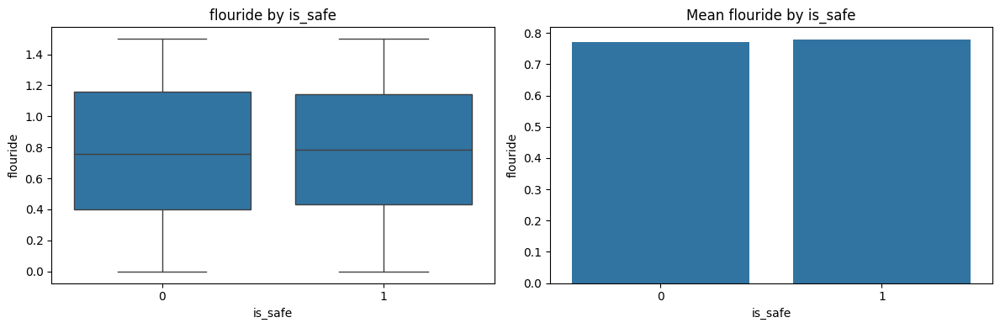

Means:
 is_safe
0    0.770623
1    0.779594
Name: flouride, dtype: float64

--- bacteria vs is_safe ---


/tmp/ipython-input-2917442429.py:43: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.barplot(x='is_safe', y=col, data=df, ci=None)


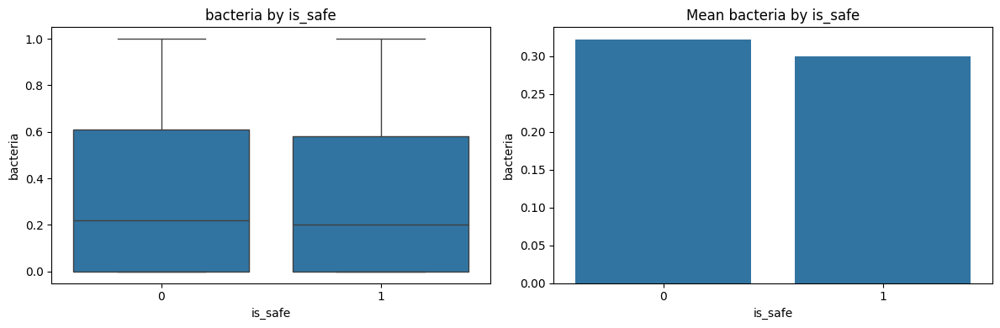

Means:
 is_safe
0    0.322324
1    0.299441
Name: bacteria, dtype: float64

--- viruses vs is_safe ---


/tmp/ipython-input-2917442429.py:43: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.barplot(x='is_safe', y=col, data=df, ci=None)


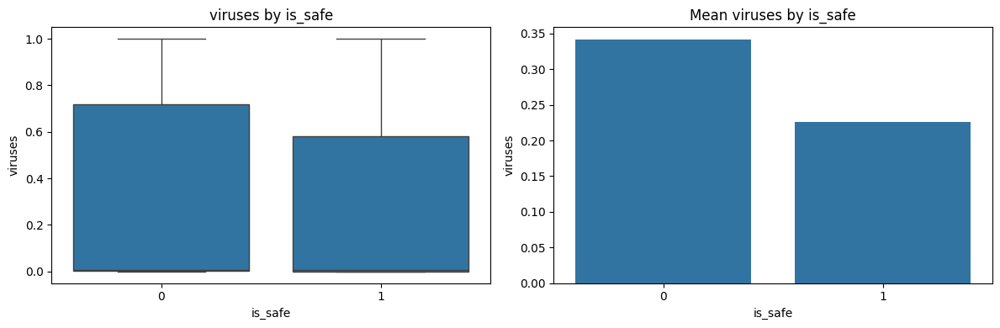

Means:
 is_safe
0    0.341871
1    0.226451
Name: viruses, dtype: float64

--- lead vs is_safe ---


/tmp/ipython-input-2917442429.py:43: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.barplot(x='is_safe', y=col, data=df, ci=None)


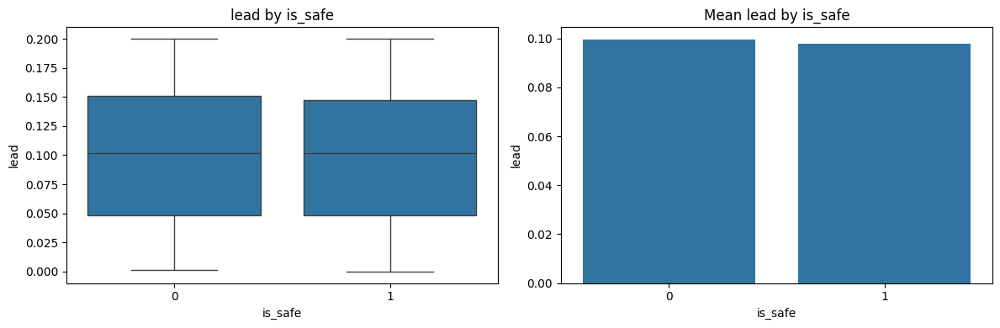

Means:
 is_safe
0    0.099639
1    0.097815
Name: lead, dtype: float64

--- nitrates vs is_safe ---


/tmp/ipython-input-2917442429.py:43: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.barplot(x='is_safe', y=col, data=df, ci=None)


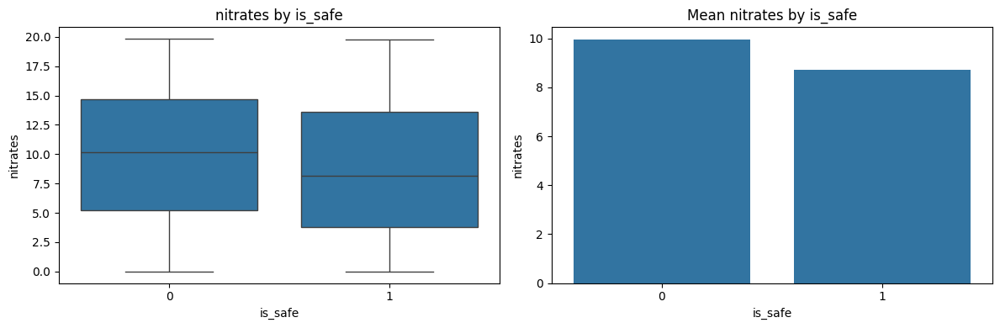

Means:
 is_safe
0    9.962612
1    8.705680
Name: nitrates, dtype: float64

--- nitrites vs is_safe ---


/tmp/ipython-input-2917442429.py:43: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.barplot(x='is_safe', y=col, data=df, ci=None)


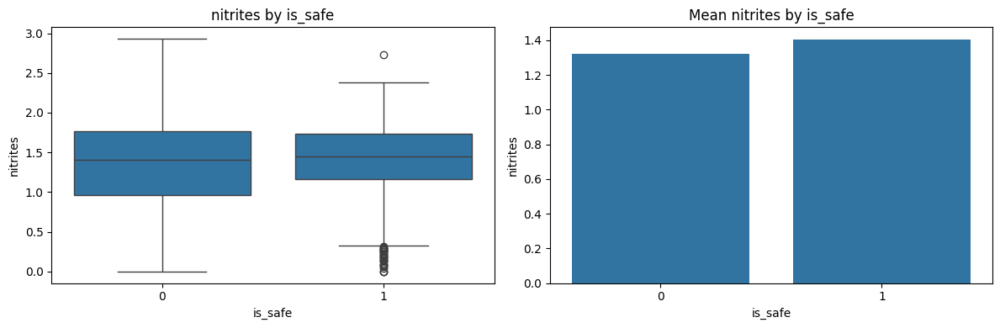

Means:
 is_safe
0    1.320182
1    1.404912
Name: nitrites, dtype: float64

--- mercury vs is_safe ---


/tmp/ipython-input-2917442429.py:43: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.barplot(x='is_safe', y=col, data=df, ci=None)


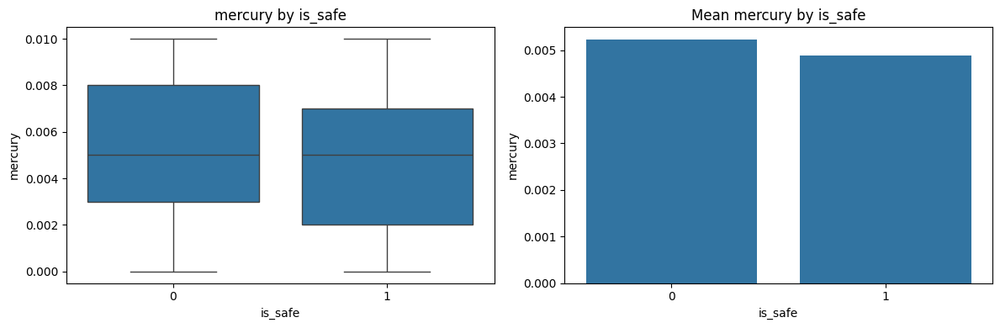

Means:
 is_safe
0    0.005232
1    0.004888
Name: mercury, dtype: float64

--- perchlorate vs is_safe ---


/tmp/ipython-input-2917442429.py:43: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.barplot(x='is_safe', y=col, data=df, ci=None)


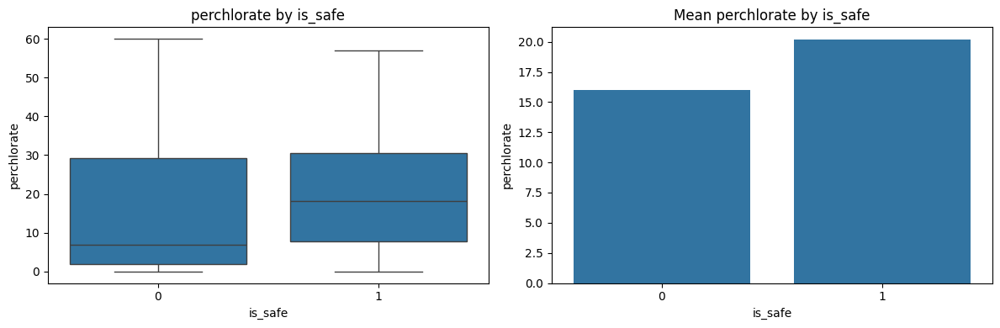

Means:
 is_safe
0    15.984616
1    20.198739
Name: perchlorate, dtype: float64

--- radium vs is_safe ---


/tmp/ipython-input-2917442429.py:43: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.barplot(x='is_safe', y=col, data=df, ci=None)


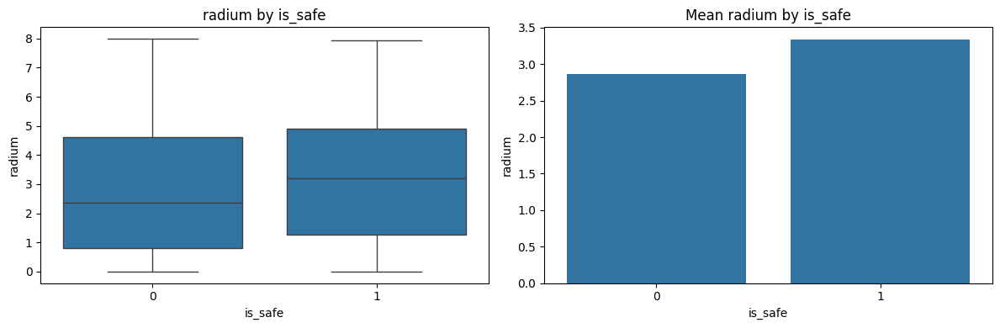

Means:
 is_safe
0    2.866150
1    3.339211
Name: radium, dtype: float64

--- selenium vs is_safe ---


/tmp/ipython-input-2917442429.py:43: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.barplot(x='is_safe', y=col, data=df, ci=None)


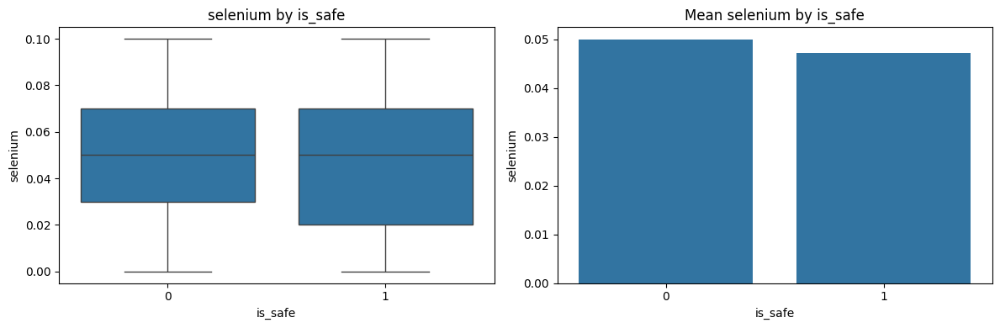

Means:
 is_safe
0    0.050003
1    0.047204
Name: selenium, dtype: float64

--- silver vs is_safe ---


/tmp/ipython-input-2917442429.py:43: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.barplot(x='is_safe', y=col, data=df, ci=None)


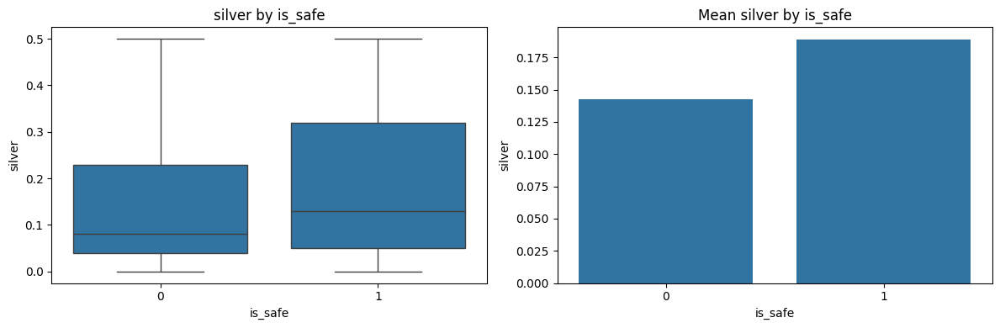

Means:
 is_safe
0    0.142516
1    0.188947
Name: silver, dtype: float64

--- uranium vs is_safe ---


/tmp/ipython-input-2917442429.py:43: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.barplot(x='is_safe', y=col, data=df, ci=None)


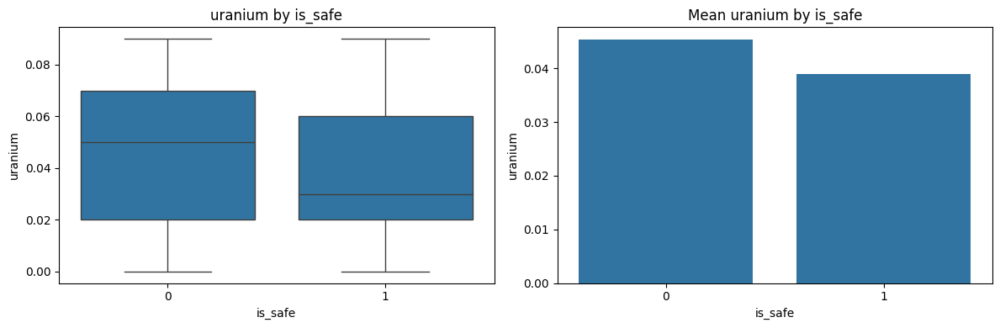

Means:
 is_safe
0    0.045402
1    0.039002
Name: uranium, dtype: float64


In [6]:
# --- TASK 4: BIVARIATE ANALYSIS WITH is_safe ---

import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

print("\n=== TASK 4: BIVARIATE ANALYSIS WITH is_safe ===")

# quick safe conversion (coerce bad values to NaN, then drop them)
df['is_safe'] = pd.to_numeric(df['is_safe'], errors='coerce')
n_invalid = df['is_safe'].isna().sum()
print(f"\nInvalid/non-numeric is_safe entries: {n_invalid}")
if n_invalid > 0:
    # show examples (up to 10)
    print("\nExamples of invalid is_safe values:")
    print(df[df['is_safe'].isna()].head(10).to_string(index=False))
    # drop them (keeps code short like Car_Sales notebook)
    df = df[df['is_safe'].notna()].copy()
    print(f"\nDropped {n_invalid} rows with invalid is_safe. New shape: {df.shape}")

# finalize as int
df['is_safe'] = df['is_safe'].astype(int)

print("\nClass Counts:\n", df['is_safe'].value_counts())

# countplot
plt.figure(figsize=(5,4))
sns.countplot(x=df['is_safe'])
plt.title("is_safe Countplot")
plt.show()

# boxplot + mean barplot for each numeric feature (except is_safe)
num_cols = [c for c in df.select_dtypes(include=['number']).columns if c != 'is_safe']
for col in num_cols:
    print(f"\n--- {col} vs is_safe ---")
    plt.figure(figsize=(12,4))

    plt.subplot(1,2,1)
    sns.boxplot(x='is_safe', y=col, data=df)
    plt.title(f"{col} by is_safe")

    plt.subplot(1,2,2)
    sns.barplot(x='is_safe', y=col, data=df, ci=None)
    plt.title(f"Mean {col} by is_safe")

    plt.tight_layout()
    plt.show()

    # print group means (short)
    print("Means:\n", df.groupby('is_safe')[col].mean())



=== TASK 5: CORRELATION ANALYSIS ===

Correlation Matrix:
              aluminium   ammonia   arsenic    barium   cadmium  chloramine  \
aluminium     1.000000  0.067369  0.225725  0.294091 -0.099902    0.369221   
ammonia       0.067369  1.000000  0.046783  0.070099 -0.006422    0.104775   
arsenic       0.225725  0.046783  1.000000  0.362925  0.334782    0.356509   
barium        0.294091  0.070099  0.362925  1.000000 -0.037901    0.446869   
cadmium      -0.099902 -0.006422  0.334782 -0.037901  1.000000   -0.144366   
chloramine    0.369221  0.104775  0.356509  0.446869 -0.144366    1.000000   
chromium      0.353134  0.124782  0.312421  0.415937 -0.157716    0.555846   
copper        0.168569  0.015953 -0.036488  0.065277 -0.109252    0.118975   
flouride     -0.009877 -0.028221  0.003731 -0.018637  0.005005    0.004254   
bacteria     -0.078324  0.063603  0.035642  0.101304 -0.092133    0.154443   
viruses      -0.071040  0.105856  0.011596 -0.002429  0.021255    0.003432   
lead

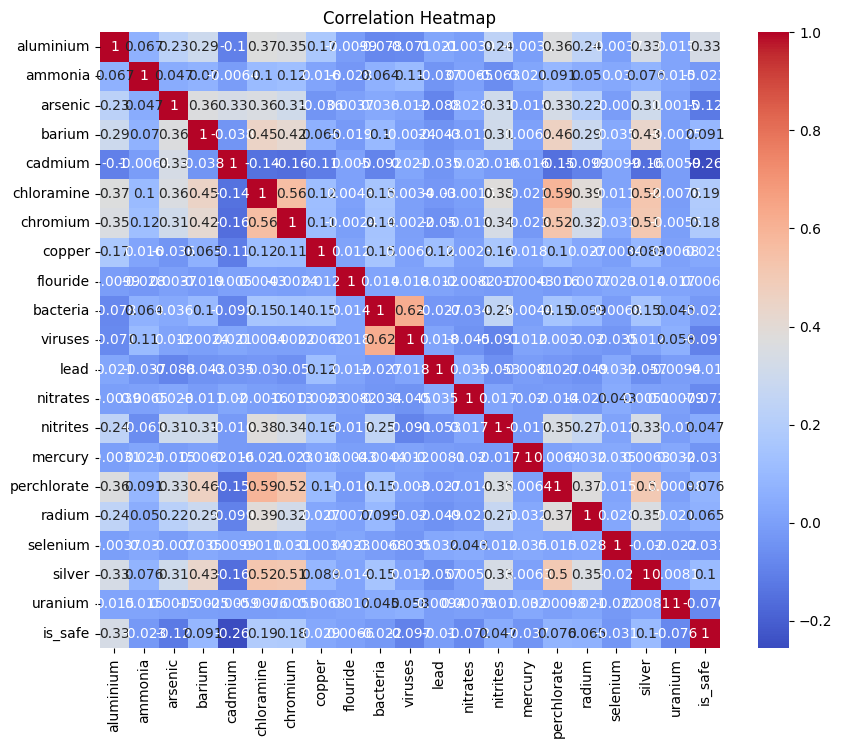


Correlation with is_safe:
 is_safe        1.000000
aluminium      0.333974
chloramine     0.186704
chromium       0.182306
silver         0.102813
barium         0.090858
perchlorate    0.075735
radium         0.064743
nitrites       0.046986
copper         0.029498
flouride       0.006550
lead          -0.009970
bacteria      -0.022077
ammonia       -0.022919
selenium      -0.030923
mercury       -0.036817
nitrates      -0.072100
uranium       -0.075619
viruses       -0.097040
arsenic       -0.123362
cadmium       -0.256034
Name: is_safe, dtype: float64


In [7]:
# TASK 5: Correlation Analysis

import matplotlib.pyplot as plt
import seaborn as sns

print("\n=== TASK 5: CORRELATION ANALYSIS ===")

corr = df.corr()
print("\nCorrelation Matrix:\n", corr)

plt.figure(figsize=(10,8))
sns.heatmap(corr, annot=True, cmap='coolwarm')
plt.title("Correlation Heatmap")
plt.show()

if "is_safe" in df.columns:
    print("\nCorrelation with is_safe:\n", corr['is_safe'].sort_values(ascending=False))



=== TASK 6: OUTLIER DETECTION ===

Outlier counts per feature:
 {'aluminium': np.int64(1731), 'arsenic': np.int64(1634), 'barium': np.int64(0), 'cadmium': np.int64(0), 'chloramine': np.int64(0), 'chromium': np.int64(0), 'copper': np.int64(0), 'flouride': np.int64(0), 'bacteria': np.int64(0), 'viruses': np.int64(0), 'lead': np.int64(0), 'nitrates': np.int64(0), 'nitrites': np.int64(2), 'mercury': np.int64(0), 'perchlorate': np.int64(0), 'radium': np.int64(0), 'selenium': np.int64(0), 'silver': np.int64(0), 'uranium': np.int64(0)}


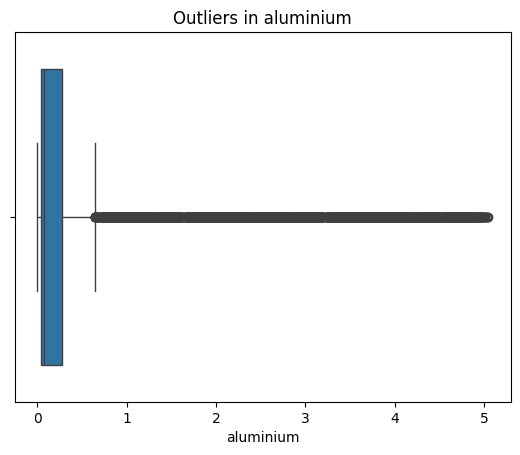

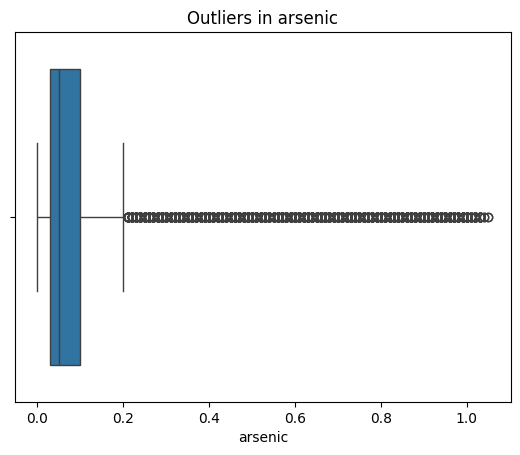

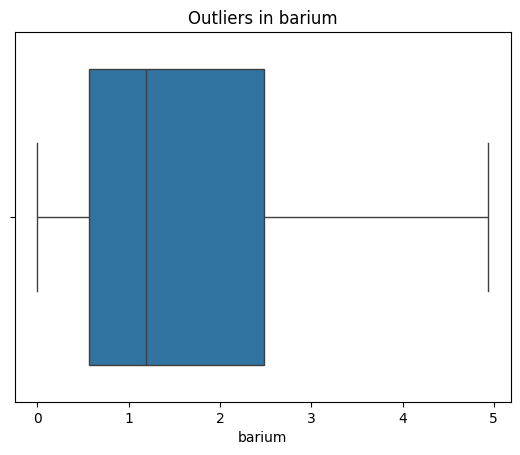

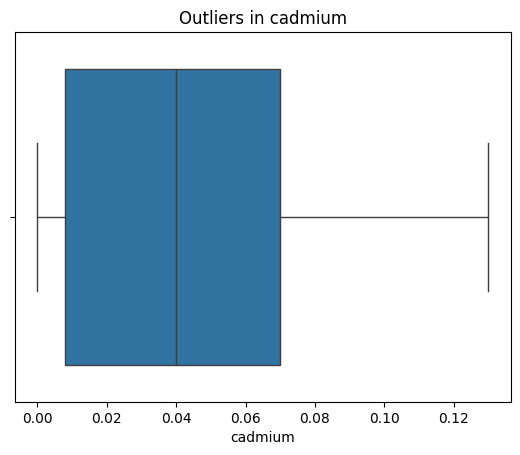

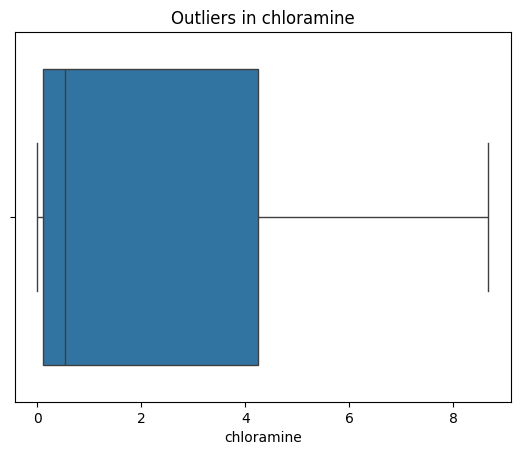

...

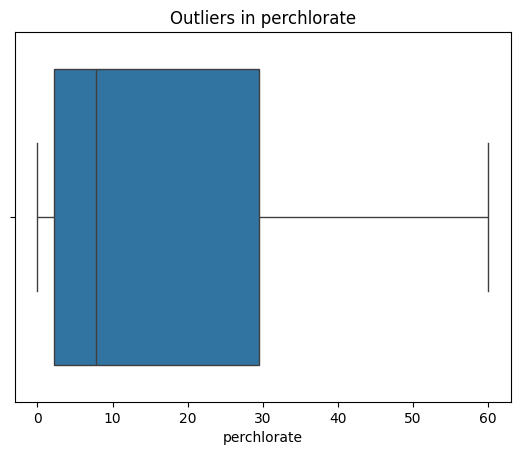

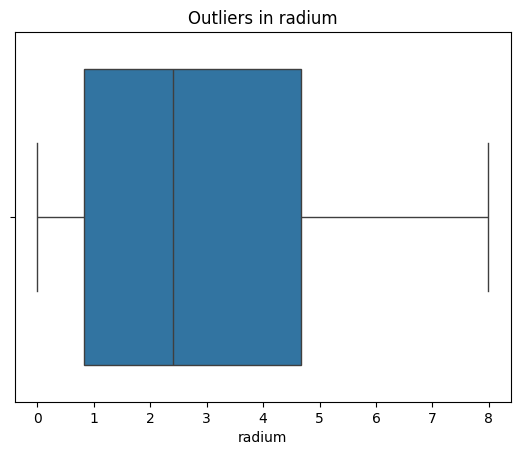

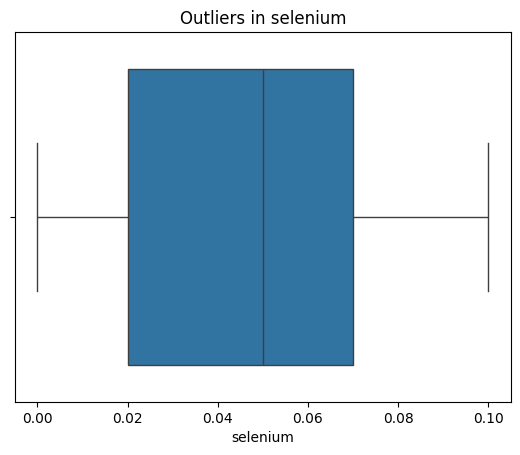

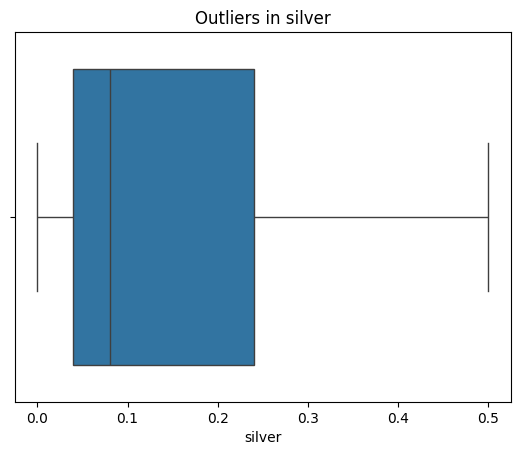

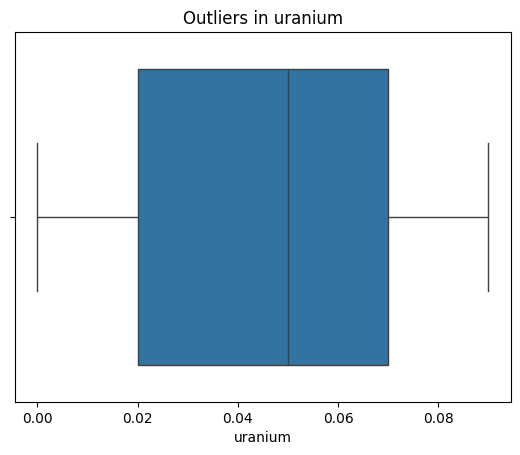

In [8]:
# TASK 6: Outlier Detection

import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

print("\n=== TASK 6: OUTLIER DETECTION ===")

outliers = {}

num_cols = df.select_dtypes(include=[np.number]).columns.tolist()

for col in num_cols:
    if col == 'is_safe': continue

    q1 = df[col].quantile(0.25)
    q3 = df[col].quantile(0.75)
    iqr = q3 - q1
    lower = q1 - 1.5*iqr
    upper = q3 + 1.5*iqr

    outliers[col] = ((df[col] < lower) | (df[col] > upper)).sum()

print("\nOutlier counts per feature:\n", outliers)

# Show boxplots for visual confirmation
for col in num_cols:
    if col == 'is_safe': continue
    sns.boxplot(x=df[col])
    plt.title(f"Outliers in {col}")
    plt.show()



=== TASK 7: FEATURE RELATIONSHIPS ===

Creating Pairplot… (may take time)


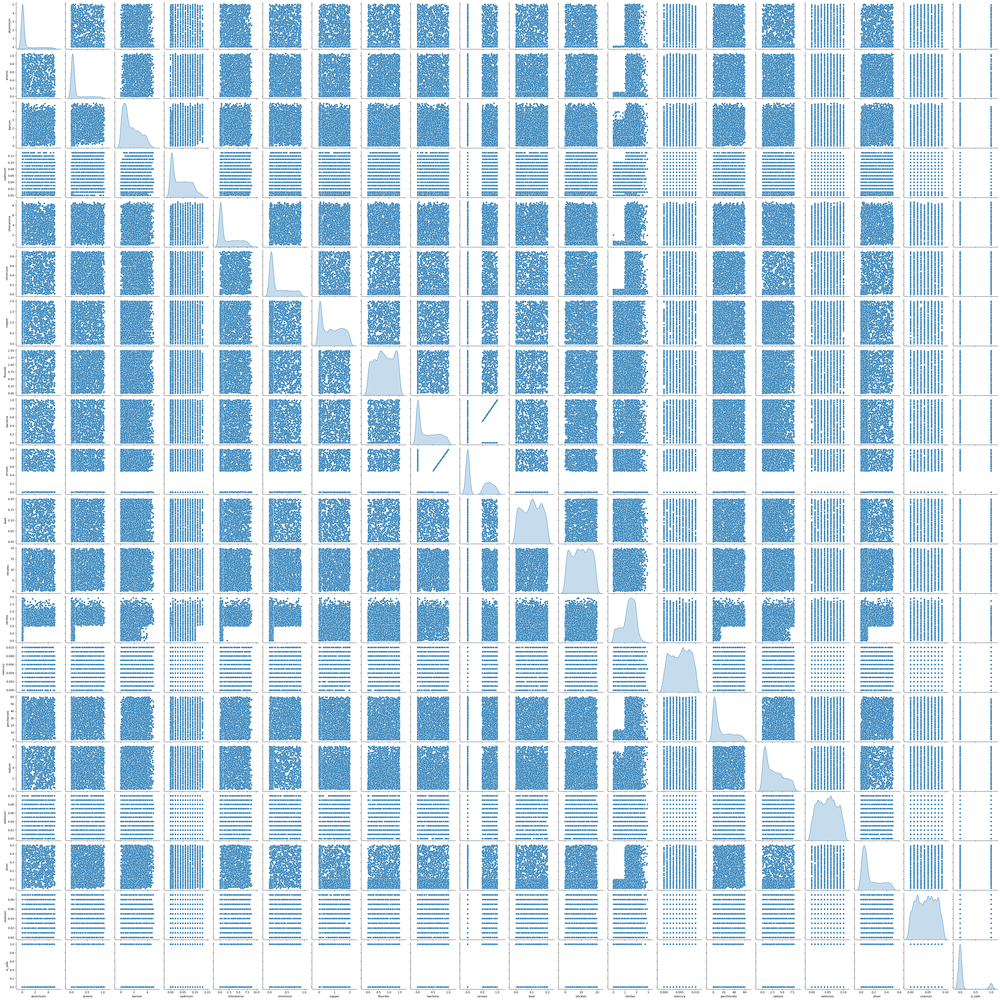

In [9]:
# TASK 7: Feature Relationships

import seaborn as sns
import matplotlib.pyplot as plt

print("\n=== TASK 7: FEATURE RELATIONSHIPS ===")

num_cols = df.select_dtypes(include=[float, int]).columns.tolist()

print("\nCreating Pairplot… (may take time)")
sns.pairplot(df[num_cols], diag_kind='kde')
plt.show()

if "pH" in df.columns and "Conductivity" in df.columns:
    print("\nPlotting pH vs Conductivity...")

    sns.jointplot(x='pH', y='Conductivity', data=df, kind='scatter')
    plt.show()



=== TASK 8: CLASS DISTRIBUTION ===

Counts:
 is_safe
0    7084
1     912
Name: count, dtype: int64

Percentages:
 is_safe
0    88.594297
1    11.405703
Name: proportion, dtype: float64


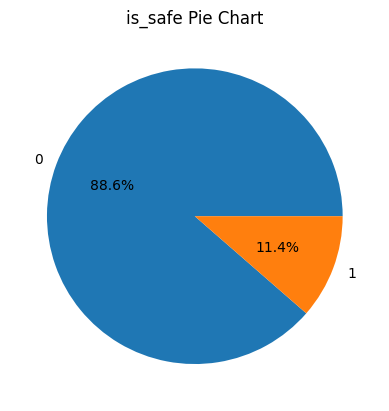

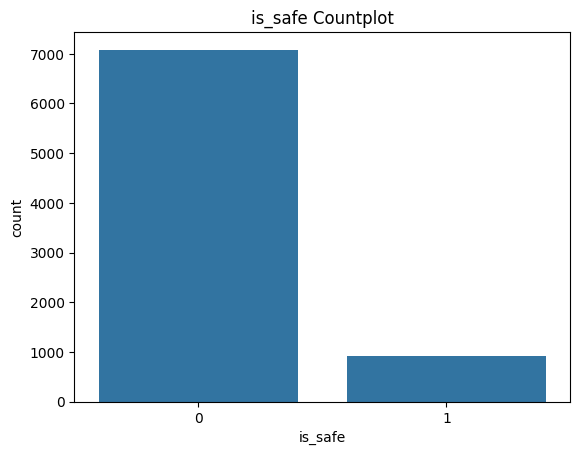

In [10]:
# TASK 8: Class Distribution

import matplotlib.pyplot as plt
import seaborn as sns

print("\n=== TASK 8: CLASS DISTRIBUTION ===")

if 'is_safe' in df.columns:
    counts = df['is_safe'].value_counts()
    pct = df['is_safe'].value_counts(normalize=True)*100

    print("\nCounts:\n", counts)
    print("\nPercentages:\n", pct)

    plt.pie(counts, labels=counts.index, autopct='%1.1f%%')
    plt.title("is_safe Pie Chart")
    plt.show()

    sns.countplot(x=df['is_safe'])
    plt.title("is_safe Countplot")
    plt.show()
else:
    print("ERROR: 'is_safe' column not found.")


In [11]:
# TASK 9: Key Insights Summary

print("\n=== TASK 9: KEY INSIGHTS SUMMARY ===")

insights = []

if "is_safe" in df.columns:
    corr = df.corr()['is_safe'].sort_values(ascending=False)
    insights.append("\nTop correlated features with is_safe:\n" + str(corr.head()))
    insights.append("\nLowest correlated features with is_safe:\n" + str(corr.tail()))

insights.append("\nOutliers suggest measurement issues or contamination.")
insights.append("Safe vs unsafe water shows noticeable difference in multiple chemical features.")

print("\n".join(insights))



=== TASK 9: KEY INSIGHTS SUMMARY ===

Top correlated features with is_safe:
is_safe       1.000000
aluminium     0.333974
chloramine    0.186704
chromium      0.182306
silver        0.102813
Name: is_safe, dtype: float64

Lowest correlated features with is_safe:
nitrates   -0.072100
uranium    -0.075619
viruses    -0.097040
arsenic    -0.123362
cadmium    -0.256034
Name: is_safe, dtype: float64

Outliers suggest measurement issues or contamination.
Safe vs unsafe water shows noticeable difference in multiple chemical features.
